In [1]:
import sys
import os
sys.path.append("../src/")
import combat
import numpy as np
import scipy.stats as stats
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
import sklearn
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sb
import pickle as pkl
from sklearn.linear_model import LogisticRegression, Lasso, Ridge, ElasticNet
import random as rd
import matplotlib
matplotlib.rcParams['figure.dpi'] = 500
from sklearn.preprocessing import quantile_transform
from sklearn.cross_decomposition import PLSRegression as PLS
import warnings
warnings.simplefilter("ignore")
import time 
from multiprocessing import set_start_method
#set_start_method("spawn")
from DecoID.DecoID import flatten
from sklearn.cross_decomposition import PLSRegression
from sklearn.svm import SVC
import importlib
import helper#import the module here, so that it can be reloaded.
importlib.reload(helper)



#do cross fold validation
def crossVal(X,y,obj,fit_func,pred_func,k=10,numCores=10):
    loo = KFold(n_splits=k)
    loo.get_n_splits(X)
    #p = Pool(processes = numCores)
    argList = []
    for train_index, test_index in loo.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        args = [X_train,X_test,y_train,y_test,fit_func,pred_func,obj]
        argList.append(args)
    #print('starting')
    #output = p.starmap(helper.runSplit,argList)
    output = [helper.runSplit(*x) for x in argList]
    y_true = flatten([x[0] for x in output])
    y_preds = flatten([x[1] for x in output])
    #print('finished')
    return r2_score(y_true, y_preds),y_preds,y_true

#imput matrix with half feature minimum
def imputeRowMin(arr,alt_min=2):
    #find the minimum non-zero value of each compound
    max_vals = []
    for c in arr.transpose():
        tmp = [x for x in c if x > 1e-3]
        if len(tmp) > 0:
            val = np.min(tmp)
        else:
            val = alt_min
        max_vals.append(val)
    #impute values 

    data_imp = np.zeros((len(arr),len(arr[0])))

    for c in range(len(arr[0])):
      for r in range(len(arr)):
        if arr[r,c] > 1e-3:
          data_imp[r,c] = arr[r,c]
        else:
          data_imp[r,c] = max_vals[c]/2
    return data_imp

In [2]:
#load in metadata and peak areas and associate

#read in peak data
datafilename = "../data/all_data_batches1-9.csv"
data = pd.read_csv(datafilename)

print(data.columns.values[:10])

#get area columns
areaCols = data.columns.values[7:]

#get molecule names
mol_names = data["Compound Name"].values

#extract area data and transpose
areaData = data[areaCols].transpose()

#get batch information

batchInfo = [int(x.split("_")[0][1]) for x in list(areaData.index.values)]

areaData = areaData.to_numpy()
areaData = areaData.astype(np.float)

def labeler(name):
    if "NIST" in name and "splash" not in name:
        return 0
    if "WU350" in name:
        return 1 
    if "Blank" in name:
        return 2
    else:
        return -1
samp_type = [labeler(x) for x in areaCols]

goodInd = [x for x in range(len(samp_type)) if samp_type[x] in [0,1] and batchInfo[x] in [1,2,3,4,6,7,8,9]]

samp_type = [int(x) for x in np.array(samp_type)[goodInd]]
areaData = areaData[goodInd]
batchInfo = np.array(batchInfo)[goodInd]

print(len(areaData))

['Compound Name' 'Compound Group' 'Chromatography-ion mode' 'Formula'
 'Mass' 'RT' 'CAS ID' 'B1_pBlank_1' 'B1_pBlank_2' 'B1_pBlank_3']
741


523887


No handles with labels found to put in legend.


235


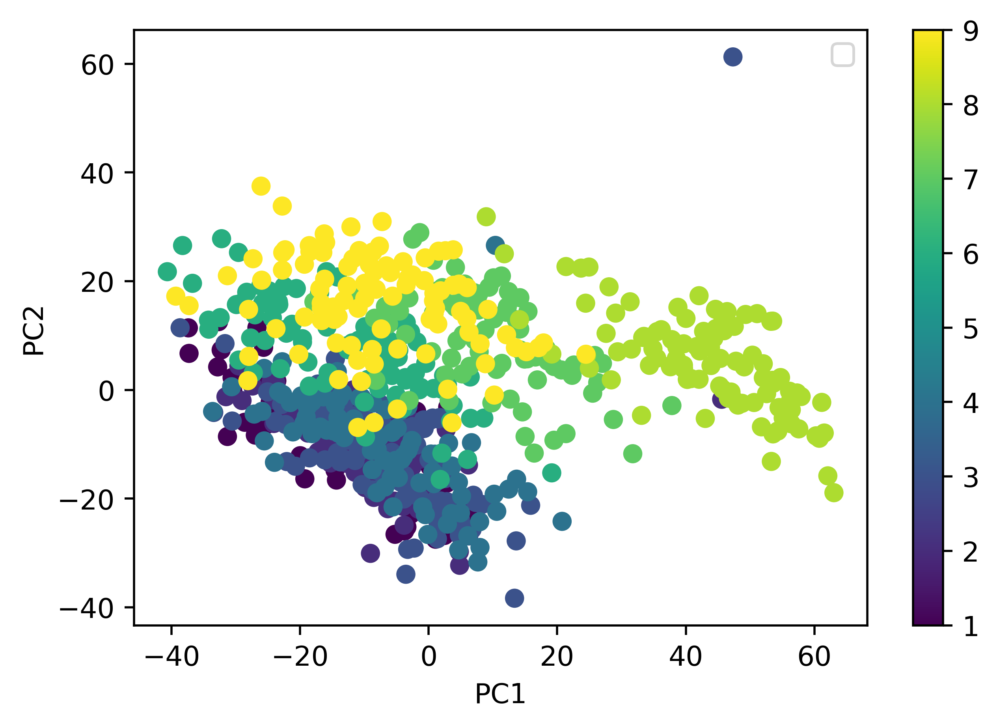

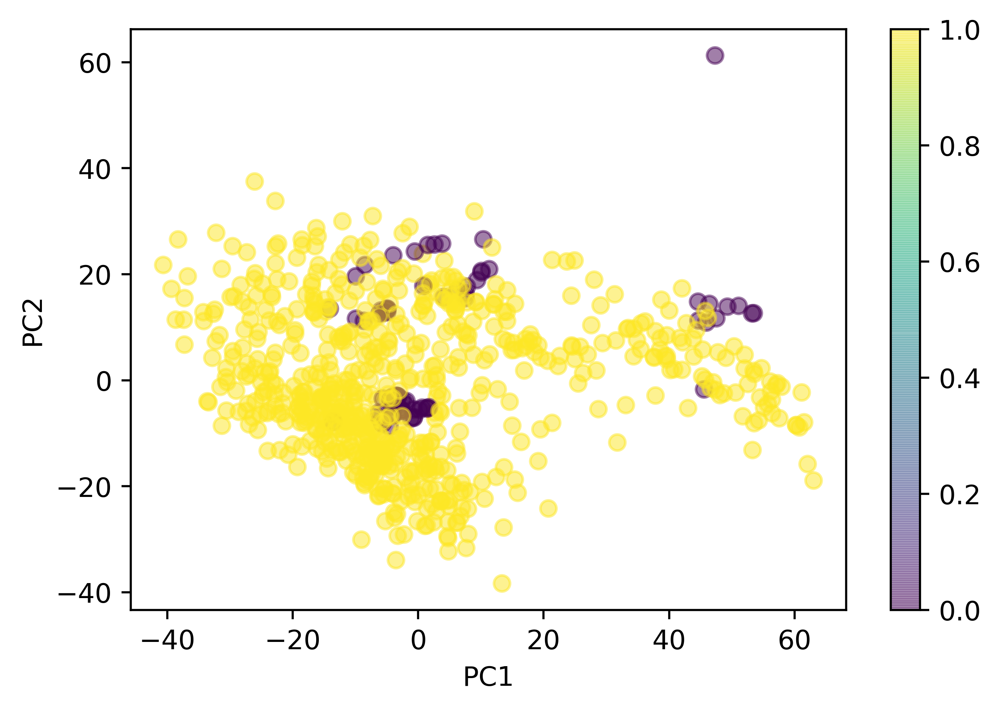

In [3]:
#visualize complete dataset

#first impute dataset
d_whole = areaData
d_whole_imput = helper.imputeRowMin(d_whole)

#log2 normalize
d_whole_imput = np.log2(d_whole_imput) 

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_imput)
loads = pca.transform(d_whole_imput)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batchInfo)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

batch_con = batchInfo

In [4]:
normalization_results = {}

No handles with labels found to put in legend.


1.6405824351808214
0.013549250077494478 0.007120491094025482 1.6405824351808214


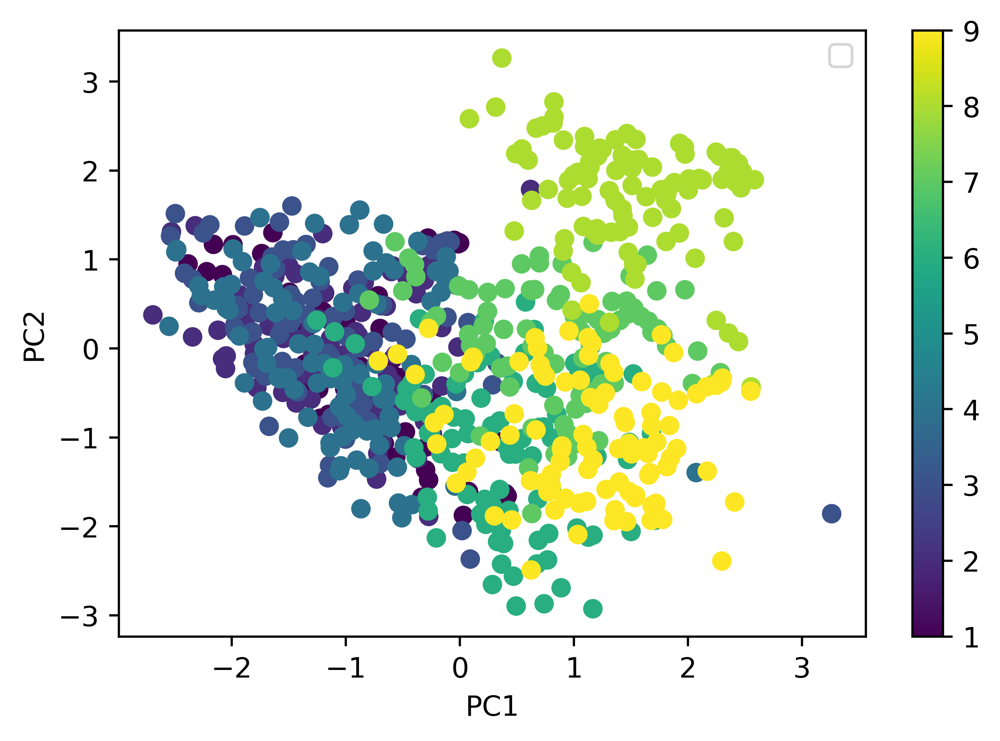

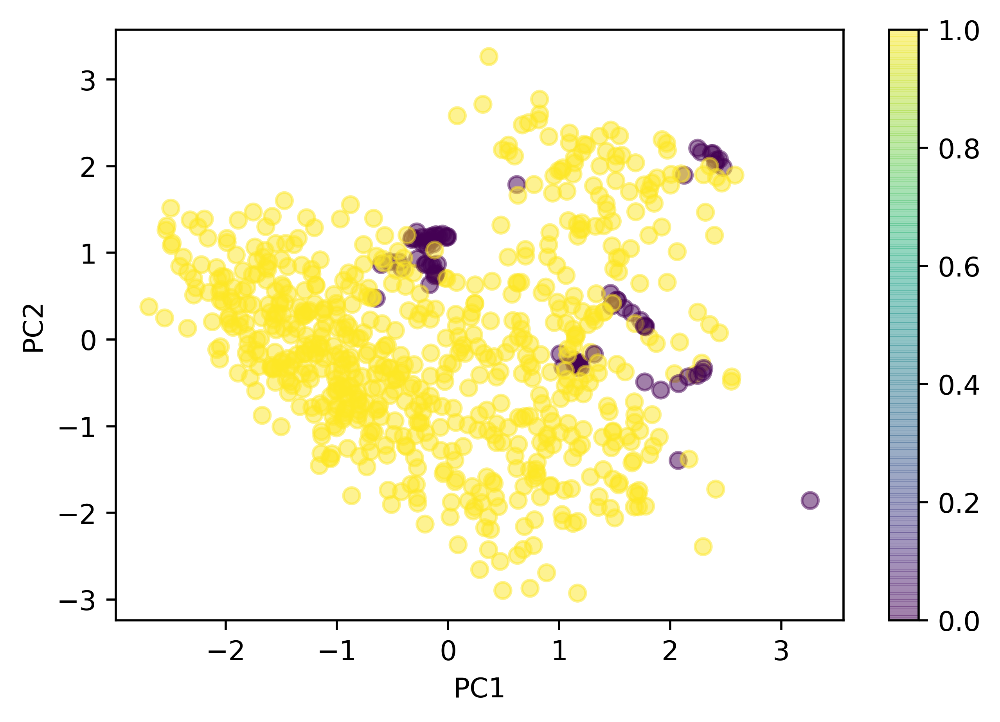

In [5]:
#now quantile normalize

d_whole_norm = quantile_transform(d_whole_imput,1)

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]

#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))

normalization_results["Quantile"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.5229774741884294
0.18223935172841266 0.10355257877868575 1.5229774741884294


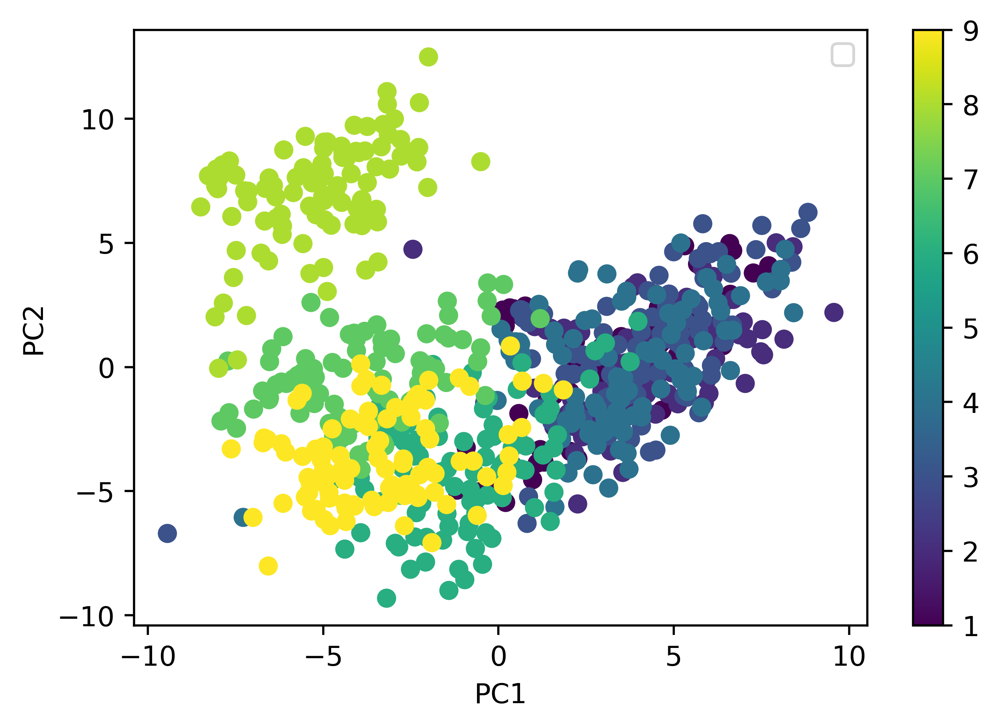

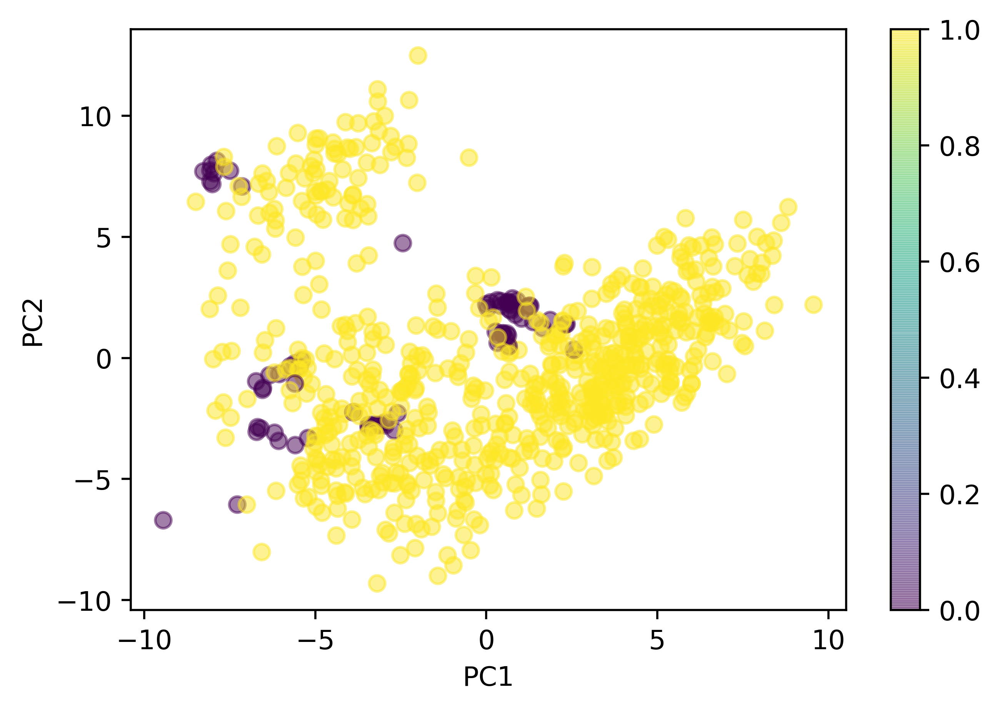

In [6]:
#now quantile normalize

d_whole_norm = quantile_transform(d_whole_imput,1,output_distribution="normal")

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]
#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["Quantile (normal)"] = np.mean(norm_var)

found 8 batches
found 0 numerical covariates...
found 0 categorical variables:	
Standardizing Data across genes.
Fitting L/S model and finding priors
Finding parametric adjustments
No handles with labels found to put in legend.


Adjusting data
1.9599464659915256
1.2412853447731074 0.6062752326600536 1.9599464659915256


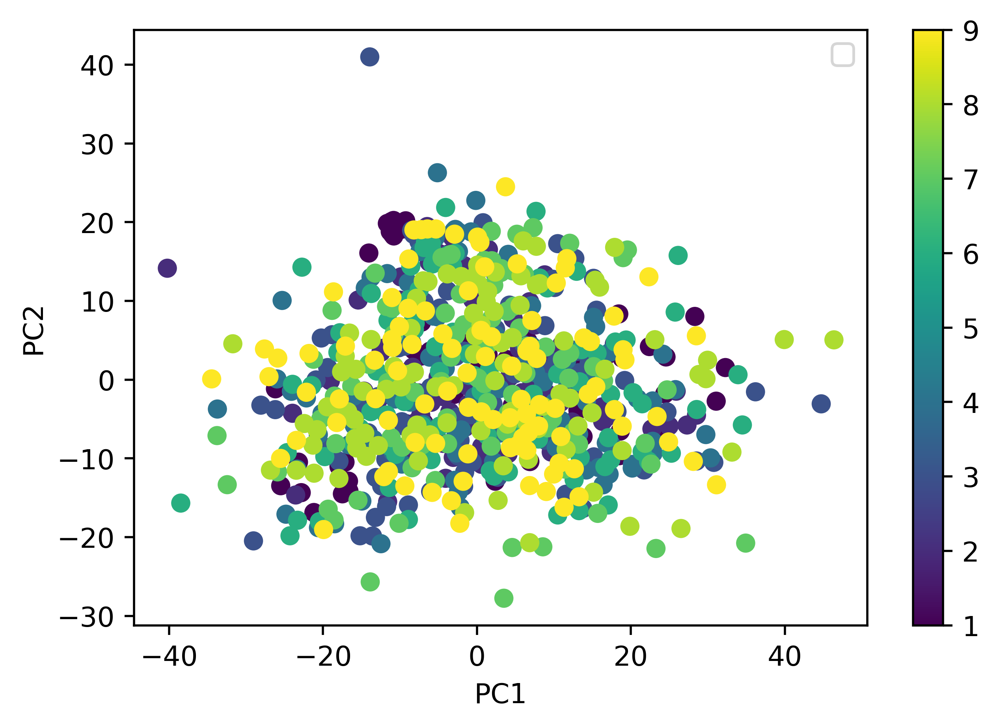

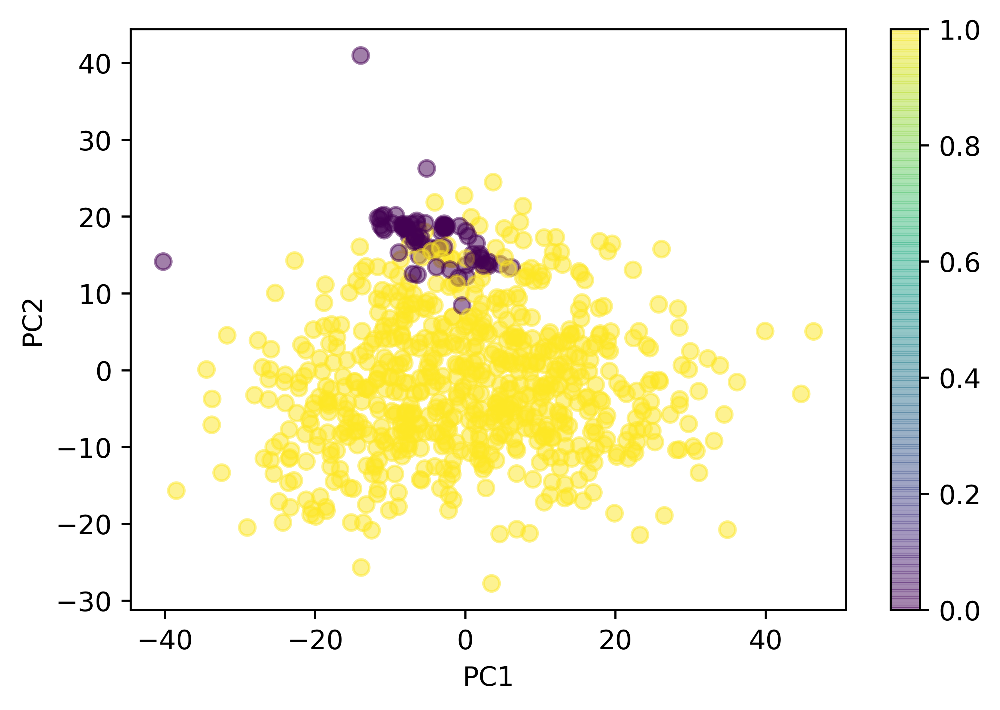

In [7]:
#now combat normalize

d_whole_norm =  combat.combat(pd.DataFrame(d_whole_imput.transpose()),batch_con).transpose().to_numpy()

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]

#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["COMBAT"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.25145414313221
2.168911522345671 1.5089994944969072 1.25145414313221


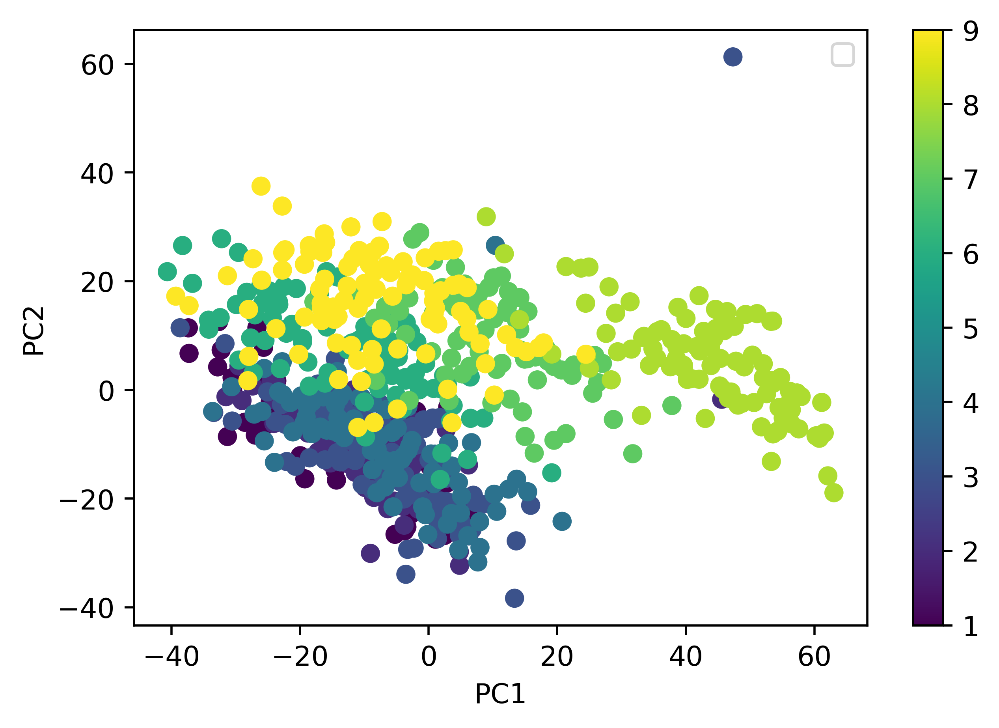

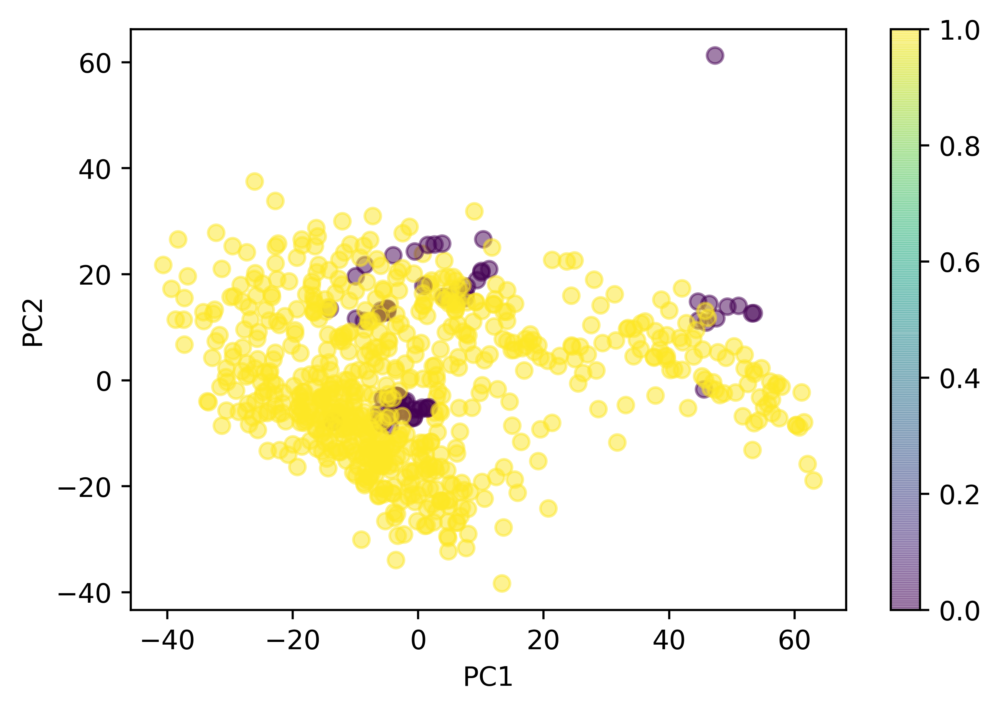

In [8]:
#now no normalize

d_whole_norm = np.array(d_whole_imput)

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]

#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["None"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.2714126014844243
9.479446738339969e-09 7.00738564457557e-09 1.2714126014844243


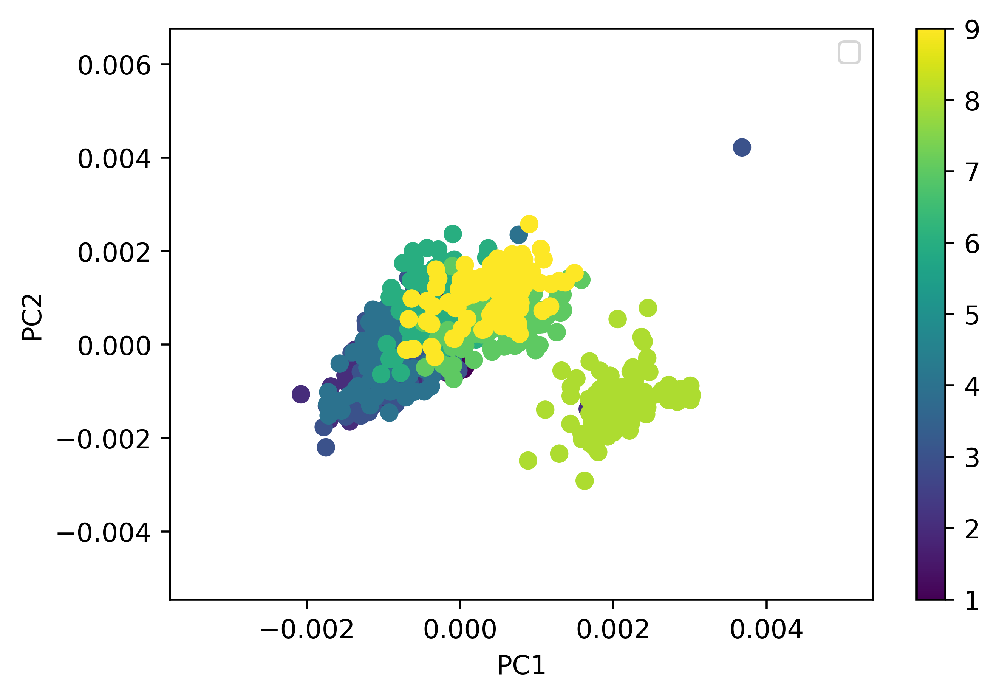

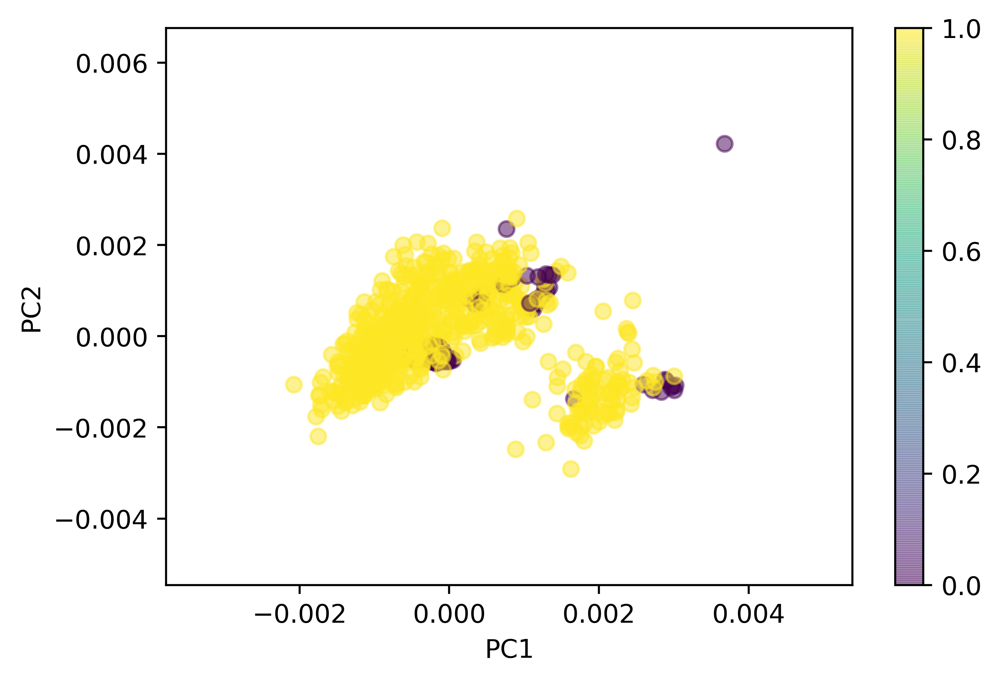

In [9]:
#now constant normalize

d_whole_norm = sklearn.preprocessing.normalize(d_whole_imput,norm="l1")

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]
#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["Constant Sum"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.2714126014844243
9.479446738339969e-09 7.00738564457557e-09 1.2714126014844243


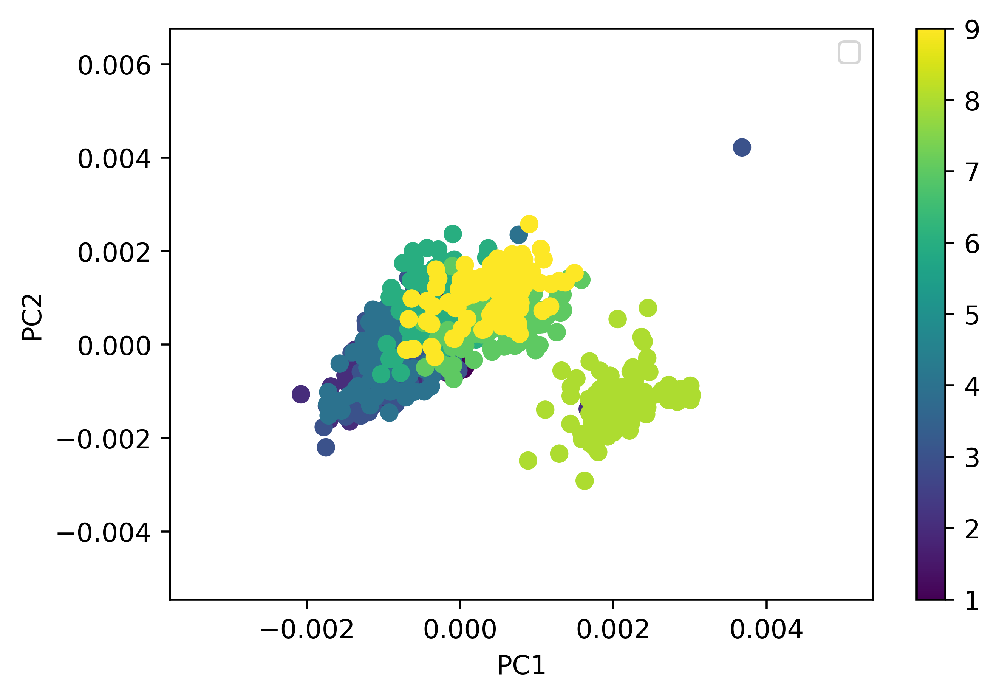

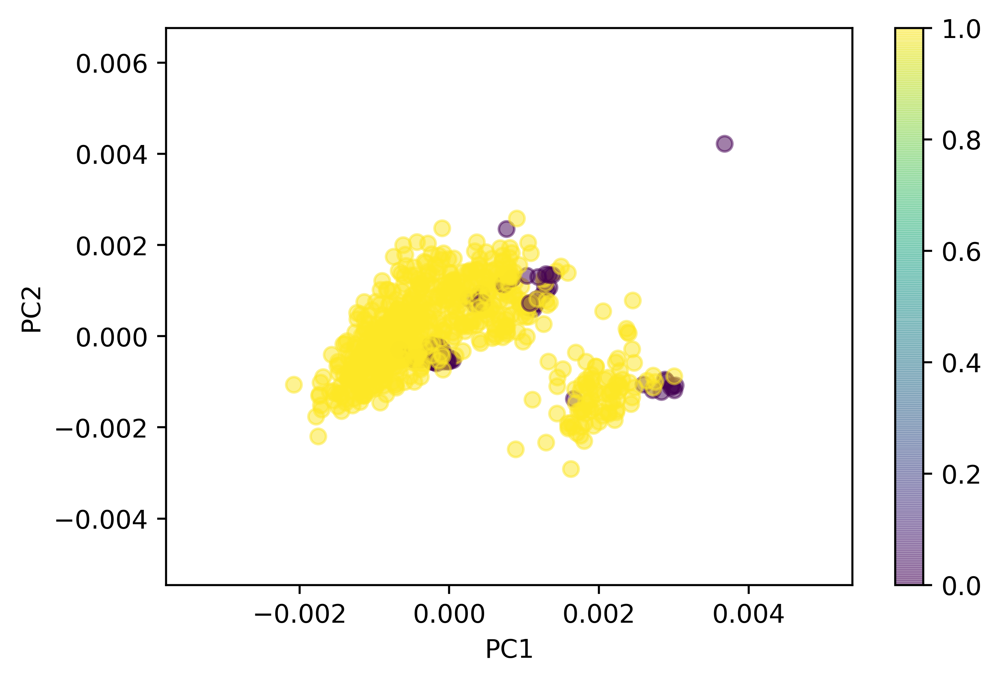

In [10]:
#now mean center and unit variance

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]
#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["Scale"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.2652197447305624
6.496053418951815e-06 4.735217290508391e-06 1.2652197447305624


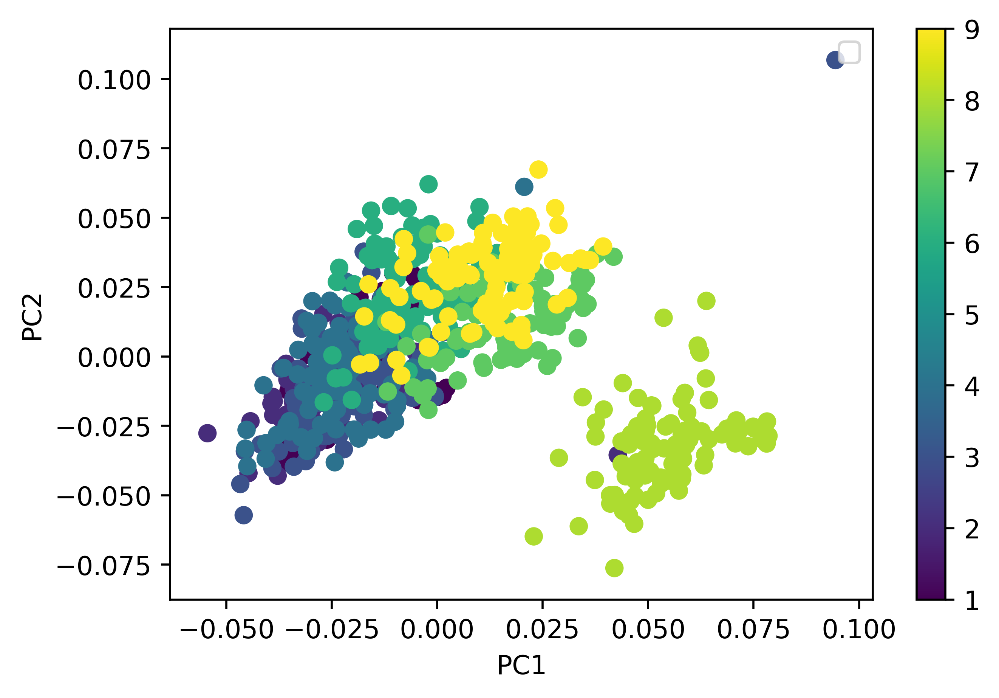

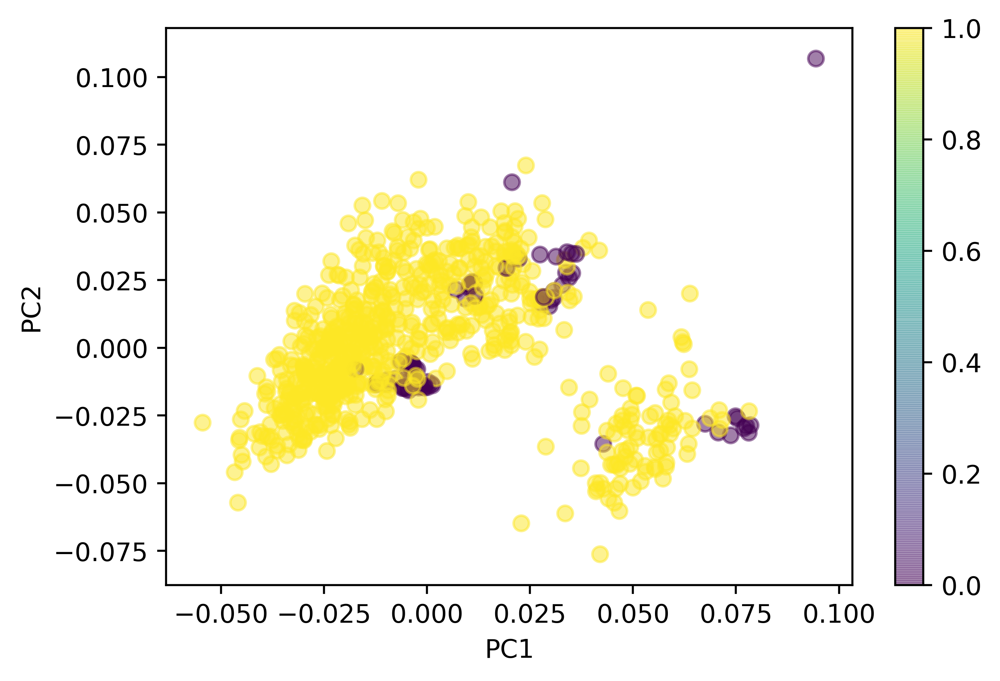

In [11]:
#normalize with l2 norm

d_whole_norm = sklearn.preprocessing.normalize(d_whole_imput,norm="l2")

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]

#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["Unit Length"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.427742291062514
0.005726677751311149 0.003929994350020602 1.427742291062514


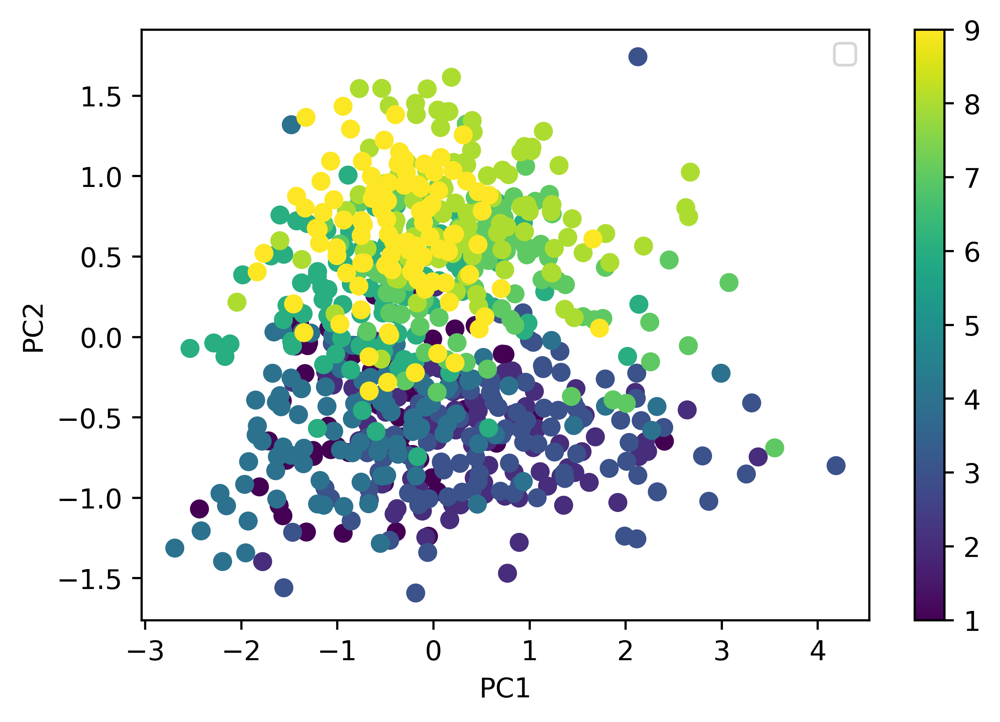

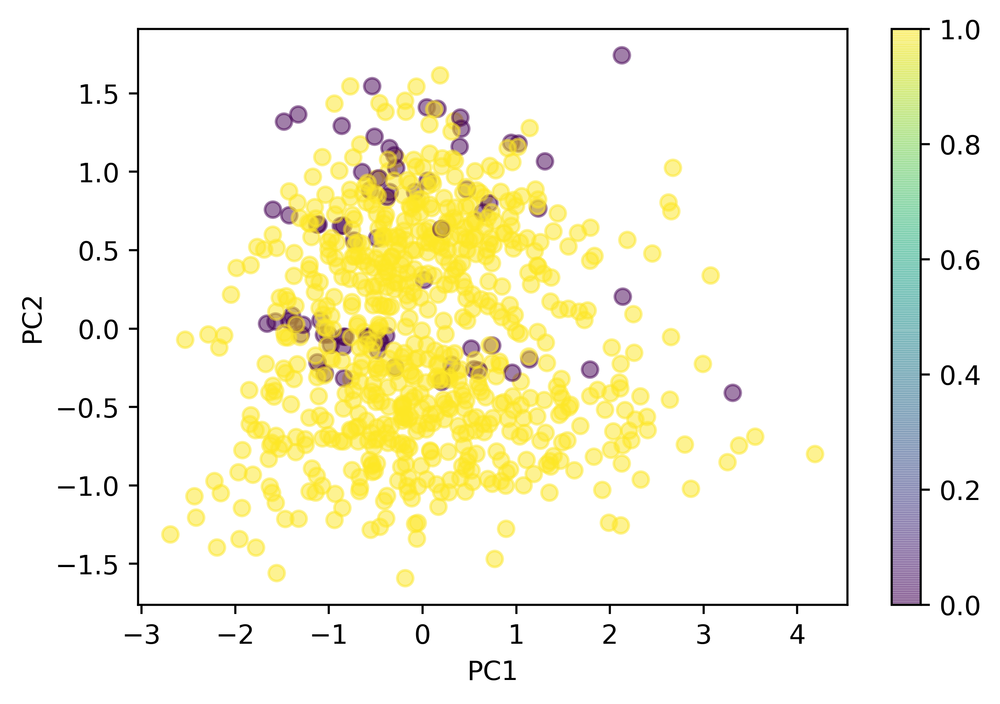

In [12]:
#now 100 percentile shift

d_whole_norm = []
for s in d_whole_imput:
    mi,ma = np.percentile(s,[0,100])
    d_whole_norm.append([(x-mi)/(ma-mi) for x in s])
    
d_whole_norm = np.array(d_whole_norm)

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]


#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["Min-Max"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.5278862116548202
0.09173028127947162 0.053243419457570794 1.5278862116548202


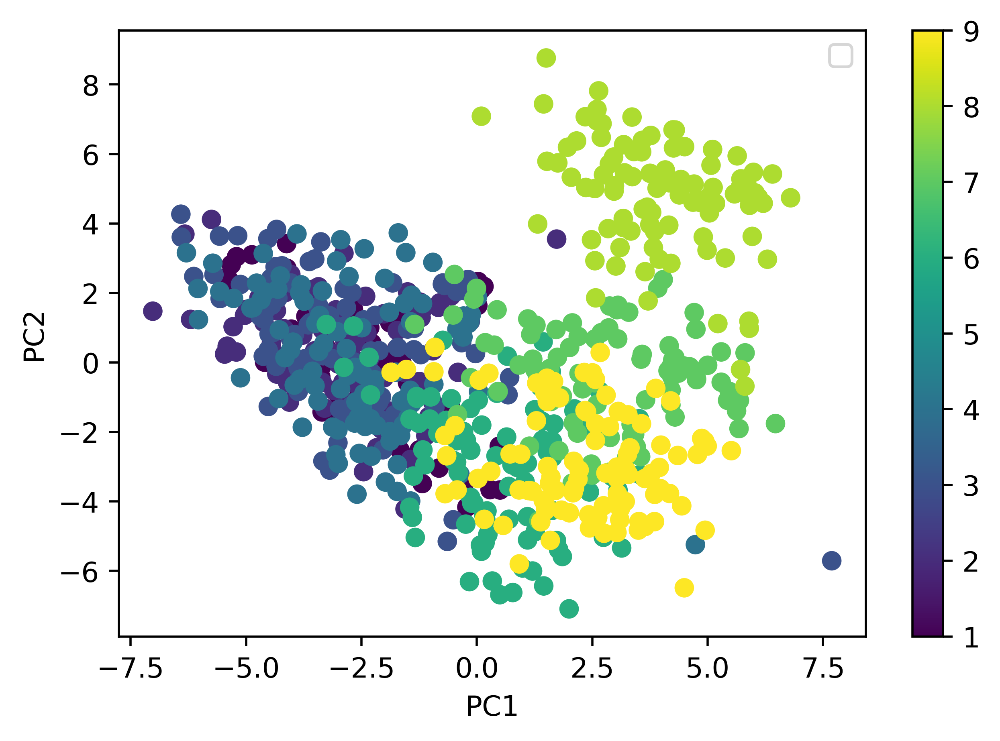

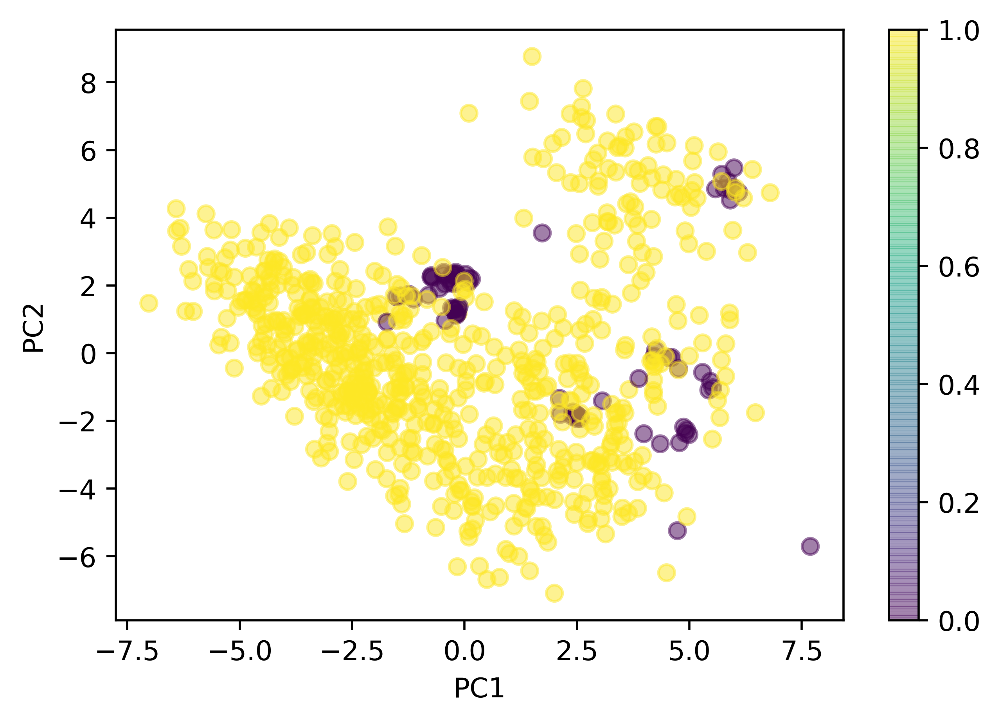

In [13]:
#now 75 percentile shift

d_whole_norm = []
for s in d_whole_imput:
    mi,ma = np.percentile(s,[25,75])
    d_whole_norm.append([(x-mi)/(ma-mi) for x in s])
    
d_whole_norm = np.array(d_whole_norm)

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]

#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["Percentile Shift"] = np.mean(norm_var)

No handles with labels found to put in legend.


1.2350989752376833
9.543539815315873e-05 7.035876382684766e-05 1.2350989752376833


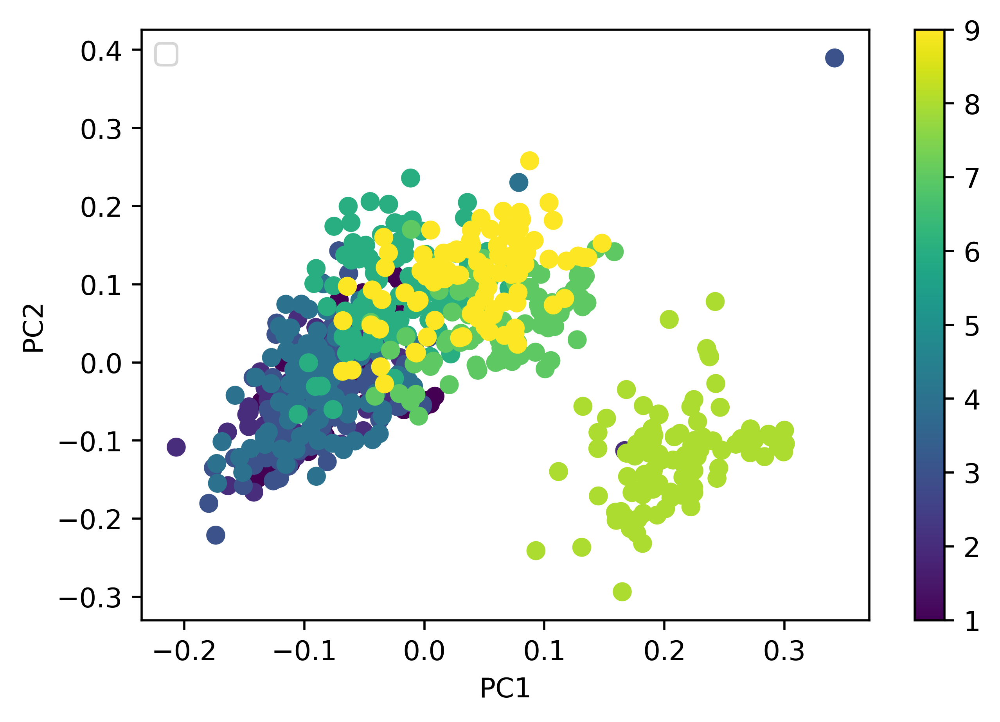

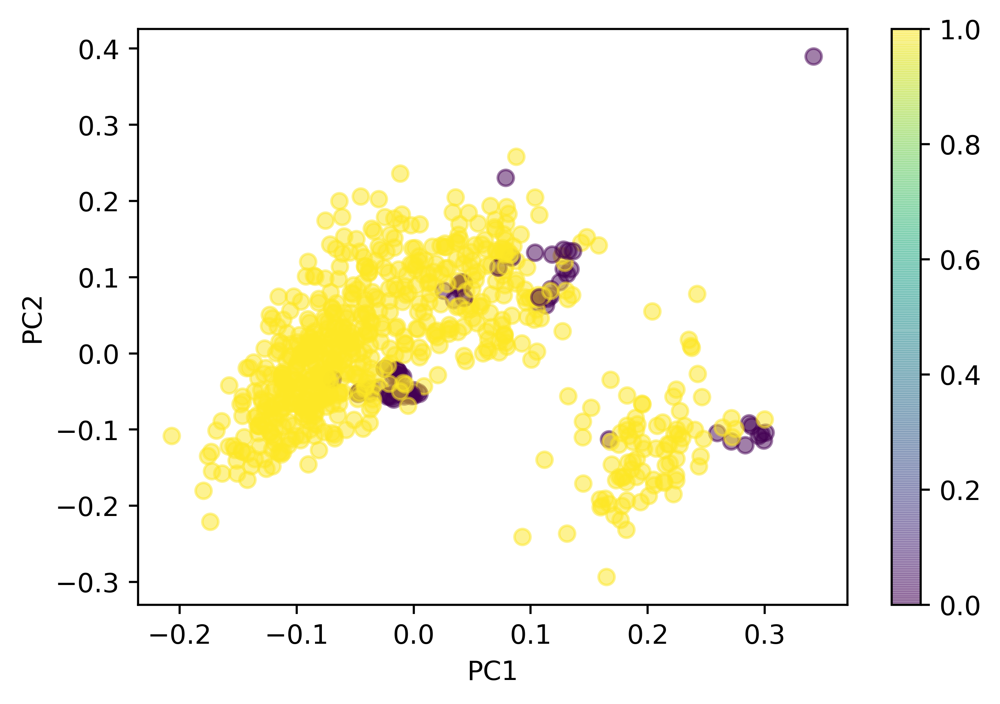

In [14]:
#now QCN scale

#sum normalize
d_whole_norm = 100*sklearn.preprocessing.normalize(d_whole_imput,norm="l1")

#get median qc sample
reference = np.array([np.median(c) for c in d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]].transpose()])

d_corr = []
for x in d_whole_norm:
    qs = []
    for f,r in zip(x,reference):
        qs.append(f/r)
    q = np.median(qs)
    d_corr.append([f/q for f in x])
    
d_whole_norm = np.array(d_corr)

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
plt.scatter(loads[:,0],loads[:,1],c=samp_type,alpha=.5)
plt.colorbar()
plt.xlabel("PC1")
plt.ylabel("PC2")

#separate samples
samp_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 1]]
qc_whole_int = d_whole_norm[[x for x in range(len(samp_type)) if samp_type[x]  == 0]]

#compute variances
sample_variance = np.var(samp_whole_int,axis=0)
qc_variance = np.var(qc_whole_int,axis=0)

norm_var = np.linalg.norm(sample_variance)/np.linalg.norm(qc_variance)

print(norm_var)

print(np.mean(sample_variance),np.mean(qc_variance),np.mean(norm_var))
normalization_results["QCN"] = np.mean(norm_var)

In [15]:
plot_df = pd.DataFrame.from_dict(normalization_results,orient="index")
plot_df = plot_df.sort_values(by=0)
plot_df

,0
QCN,1.235099
None,1.251454
Unit Length,1.265220
Constant Sum,1.271413
Scale,1.271413
Min-Max,1.427742
Quantile (normal),1.522977
Percentile Shift,1.527886
Quantile,1.640582
COMBAT,1.959946


Text(0, 0.5, 'Normalization Score')

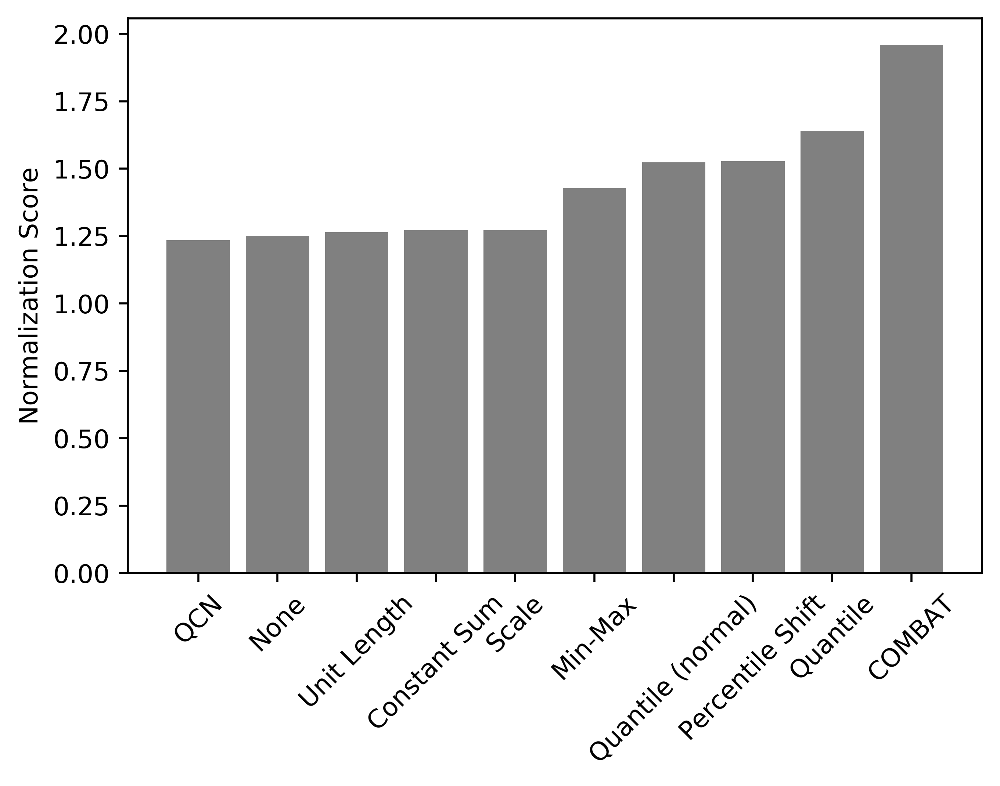

In [20]:
plt.bar(range(len(plot_df)),plot_df[0].values,tick_label=plot_df.index.values,color="grey")
plt.xticks(rotation=45)
plt.ylabel("Normalization Score")